## Introduction
In this notebook, we leverage the renowned GTZAN dataset, often referred to as the **MNIST of sounds**, which consists of 10 music genres, each containing 100 audio files, all with a standardized length of 30 seconds. The dataset is structured into two main folders : **genres_original** and **images_original**, each playing a crucial role in our classification task. The **genres_original** folder serves as my primary data source, where we directly iterate through each audio file, extracting audio features using the VGGish model.

In [2]:
pip install -q visualkeras

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install tensorflow_hub


  Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata (1.3 kB)
  Using cached tf_keras-2.16.0-py3-none-any.whl.metadata (1.6 kB)
Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl (30 kB)
Using cached tf_keras-2.16.0-py3-none-any.whl (1.7 MB)
Note: you may need to restart the kernel to use updated packages.


In [5]:
# Importing necessary libraries

# Data preprocessing
import pandas as pd
import numpy as np
import os, librosa
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Visualization
import IPython.display as ipd
import matplotlib.pyplot as plt
import seaborn as sns
from visualkeras import layered_view

# Model
import tensorflow_hub as hub
from tensorflow import keras
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras import layers, Sequential
from keras.callbacks import EarlyStopping

# Suppressing warnings
from warnings import filterwarnings
filterwarnings('ignore')

## About VGGish
The VGGish model, short for VGG-like Audio Recognition Model, is a convolutional neural network (CNN) architecture designed for audio classification tasks. It is particularly well-suited for extracting meaningful features from audio waveforms. In this notebook, we leverage a pre-trained VGGish model obtained from TensorFlow Hub. VGGish processes audio waveforms to capture hierarchical representations of acoustic features, providing a compact and effective way to characterize audio content. The model consists of multiple convolutional and pooling layers, followed by fully connected layers that map the learned features to the output classes. By using this pre-trained model, we can harness the power of transfer learning to improve the performance of our music genre classification task.

![](https://media.licdn.com/dms/image/D4D12AQEJGK0iVo8Q7g/article-cover_image-shrink_720_1280/0/1686515167325?e=1714003200&v=beta&t=i-L10EMUr_XV1eVkVzcXqiX3sH36a8E122QOBbpuJxw)

In [6]:
# Loading VGGish model from TensorFlow Hub
vggish = hub.load('https://tfhub.dev/google/vggish/1')

2024-05-30 12:30:36.125274: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Max
2024-05-30 12:30:36.125296: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2024-05-30 12:30:36.125306: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 13.50 GB
2024-05-30 12:30:36.125326: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-30 12:30:36.125349: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


# Visualizing Data

Class : AI



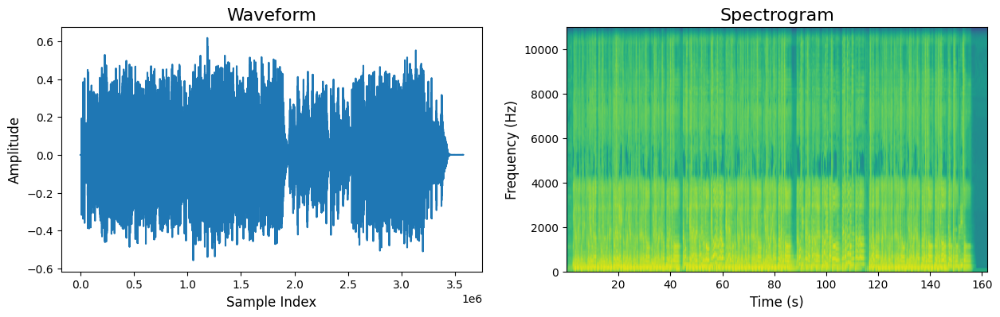

In [41]:
# Displaying a random waveform and spectrogram
audioFile = 'datasets2/AI/“김광석”이 부르는깊은 밤을 날아서 (원곡 이문세) (AI cover).wav'

# Loading audio file
waveform, sampleRate = librosa.load(audioFile)

# Displaying audio
print('Class : AI\n')
ipd.display(ipd.Audio(waveform, rate = sampleRate))

# Displaying waveform
plt.figure(figsize = (15, 4))
plt.subplot(1, 2, 1)
plt.plot(waveform)
plt.title('Waveform', fontsize = 16)
plt.xlabel('Sample Index', fontsize = 12)
plt.ylabel('Amplitude', fontsize = 12)

# Displaying spectrogram
plt.subplot(1, 2, 2)
plt.specgram(waveform, Fs = sampleRate)
plt.title('Spectrogram', fontsize = 16)
plt.xlabel('Time (s)', fontsize = 12)
plt.ylabel('Frequency (Hz)', fontsize = 12)

plt.show()

Class : Human



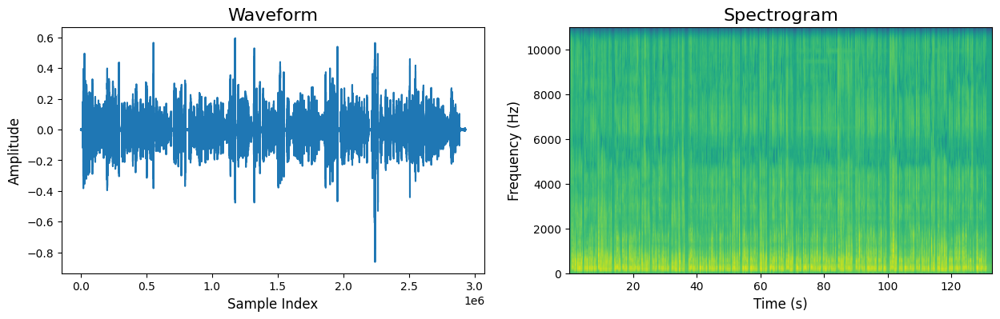

In [42]:
# Displaying a random waveform and spectrogram
audioFile = 'datasets2/Human/[수정]20210125 214547.wav'

# Loading audio file
waveform, sampleRate = librosa.load(audioFile)

# Displaying audio
print('Class : Human\n')
ipd.display(ipd.Audio(waveform, rate = sampleRate))

# Displaying waveform
plt.figure(figsize = (15, 4))
plt.subplot(1, 2, 1)
plt.plot(waveform)
plt.title('Waveform', fontsize = 16)
plt.xlabel('Sample Index', fontsize = 12)
plt.ylabel('Amplitude', fontsize = 12)

# Displaying spectrogram
plt.subplot(1, 2, 2)
plt.specgram(waveform, Fs = sampleRate)
plt.title('Spectrogram', fontsize = 16)
plt.xlabel('Time (s)', fontsize = 12)
plt.ylabel('Frequency (Hz)', fontsize = 12)

plt.show()

# Preprocessing Data

In [43]:
# Function to extract audio features using VGGish
def extractFeatures(audioFile):
    try:
        # Loading audio file
        waveform, sr = librosa.load(audioFile)
        
        # Trimming silence
        waveform, _ = librosa.effects.trim(waveform)
        
        # Extracting features using VGGish
        return vggish(waveform).numpy()
    except:
        return None

In [44]:
# Root directory containing the audio files
#root = 'datasets/audio'
root = 'datasets2'
data = []

# Iterating through the folders and files to extract features
for folder in os.listdir(root):
    folderPath = os.path.join(root, folder)
    if folder == ".DS_Store":
            continue
    
    for file in tqdm(os.listdir(folderPath), desc = f'Processing folder {folder}'):
        filePath = os.path.join(folderPath, file)
        features = extractFeatures(filePath)
        
        if features is not None:
            data.append([features, folder])

Processing folder Human: 100%|████████████████| 236/236 [00:52<00:00,  4.51it/s]


In [45]:
# Converting list into dataframe
data = pd.DataFrame(data, columns = ['Features', 'Class'])
data.head()

,Features,Class
0,"[[3639.6865, -1460.8246, -3964.4133, 247.91177...",AI
1,"[[2173.4243, -973.6511, -2355.1008, 164.69148,...",AI
2,"[[2363.6577, -911.9557, -2518.952, 276.57892, ...",AI
3,"[[3526.938, -1513.6047, -3928.8237, 325.13135,...",AI
4,"[[2543.7212, -953.09686, -2740.0935, 296.84207...",AI


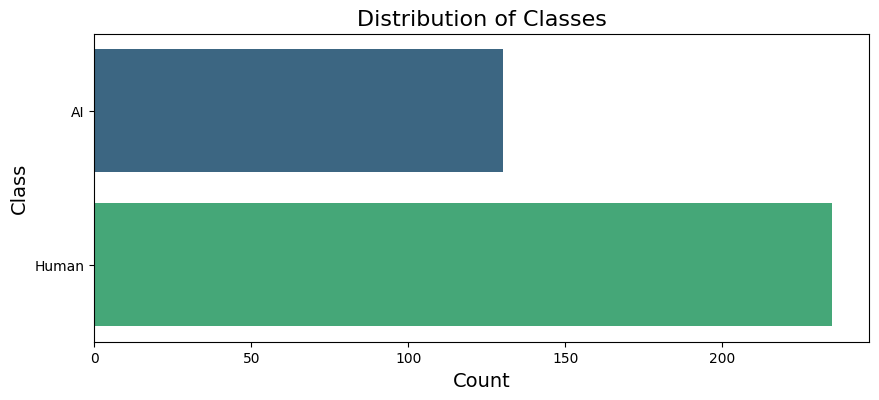

In [46]:
# Plotting count distribution of classes
plt.figure(figsize = (10, 4))
sns.countplot(y = data['Class'], palette = 'viridis')
plt.title('Distribution of Classes', fontsize = 16)
plt.xlabel('Count', fontsize = 14)
plt.ylabel('Class', fontsize = 14)
plt.show()

In [47]:
# Padding or truncating the arrays to a fixed length
x = data['Features'].tolist()
x = pad_sequences(x, dtype = 'float32', padding = 'post', truncating = 'post')
x.shape

(365, 473, 128)

In [48]:
# Encoding class labels
encoder = LabelEncoder()
y = encoder.fit_transform(data['Class'])
y = to_categorical(y)

In [49]:
# Train-validation split
trainX, testX, trainY, testY = train_test_split(x, y, random_state = 0)

# Defining Model

In [51]:
model = Sequential([
    layers.Conv2D(32, kernel_size = (3, 3), activation = 'relu', padding = 'same', input_shape = (473, 128,1)),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    
    layers.Conv2D(64, kernel_size = (3, 3), padding = 'same', activation = 'relu'),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    
    layers.Flatten(),
    
    layers.Dense(64, activation = 'relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    
    layers.Dense(2, activation = 'softmax')
])

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

# Displaying model architecture
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 473, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 236, 64, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 236, 64, 32)    │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 236, 64, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 236, 64, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 118, 32, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 118, 32, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 118, 32, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 241664)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │    15,466,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,486,146 (59.07 MB)

 Trainable params: 15,485,826 (59.07 MB)

 Non-trainable params: 320 (1.25 KB)

In [52]:
earlyStopping = EarlyStopping(
    monitor = 'val_accuracy',
    patience = 10,
    min_delta = 0.001,
    restore_best_weights = True
)

In [53]:
history = model.fit(
    trainX, trainY,
    validation_data = (testX, testY),
    epochs = 50,
    callbacks = [earlyStopping]
)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 266ms/step - accuracy: 0.8761 - loss: 0.2759 - val_accuracy: 0.6630 - val_loss: 13.1922
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - accuracy: 0.9776 - loss: 0.0412 - val_accuracy: 0.7391 - val_loss: 4.9746
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - accuracy: 0.9759 - loss: 0.0801 - val_accuracy: 0.7826 - val_loss: 2.5299
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - accuracy: 0.9842 - loss: 0.0627 - val_accuracy: 0.8370 - val_loss: 1.4329
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.9885 - loss: 0.0462 - val_accuracy: 0.8696 - val_loss: 0.8249
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - accuracy: 0.9666 - loss: 0.1331 - val_accuracy: 0.9130 - val_loss: 0.5067
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.9884 - loss: 0.0387 - val_accuracy: 0.9239 - val_loss: 0.3634
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.9826 - loss: 0.0861 - val_accuracy: 0.9348 - val_loss: 0.28

In [54]:
historyDf = pd.DataFrame(history.history)

<Axes: >

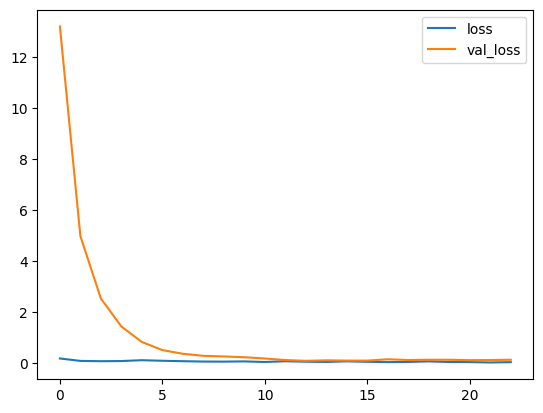

In [55]:
# Plotting training and validation loss
historyDf.loc[:, ['loss', 'val_loss']].plot()

<Axes: >

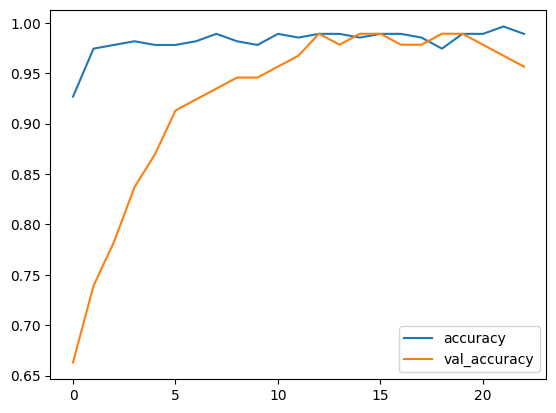

In [56]:
# Plotting training and validation accuracy
historyDf.loc[:, ['accuracy', 'val_accuracy']].plot()

In [57]:
# Evaluating model
score = model.evaluate(testX, testY)[1] * 100
print(f'Validation accuracy of model : {score:.2f}%')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9907 - loss: 0.0764
Validation accuracy of model : 98.91%


## Conclusion

In conclusion, our exploration into music genre classification using VGGish features has provided valuable insights into the challenges and nuances of analyzing audio data. Despite the inherent complexity of the task, with the GTZAN dataset acting as our sonic canvas, we achieved a commendable validation accuracy ranging between 40% and 50%. This accomplishment underscores the significance of leveraging advanced techniques such as VGGish, a purpose-built Convolutional Neural Network (CNN) for audio classification.

While our results may not reach perfection, the journey has been instrumental in understanding the intricacies of feature extraction from audio files and the potential of neural networks in capturing intricate patterns within soundscapes. The exploration of Mel Spectrograms and VGGish features has opened avenues for further refinement and experimentation in the realm of audio classification.

As we conclude this endeavor, we acknowledge the vast possibilities for improvement, whether through refining model architectures, optimizing hyperparameters, or exploring alternative audio representation methods. The pursuit of enhancing music genre classification models continues, and this notebook serves as a foundational step in unraveling the harmonies hidden within the vast landscape of audio data.